## - Import Library

In [1]:
import warnings
warnings.filterwarnings('ignore')

import copy
import os
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from PIL import Image
import cv2
from glob import glob

import torch
from torch import nn, optim
from torchvision import transforms, models
from torch_snippets import *
from torch.utils.data import DataLoader, Dataset
from torchsummary import summary 

2022-10-02 08:14:18.810 | WARNING  | torch_snippets.torch_loader:<module>:232 - Not importing Lightning Report


## - Pytorch version & Device

In [2]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

print('torch version:', torch.__version__)
print('torchvision version:', torchvision.__version__)
print('device:', device)

torch version: 1.12.0
torchvision version: 0.13.0
device: cuda


## - Parameters

In [3]:
# Select backbone model
'''
MobileNet v2: 'MobileNet_v2'
EfficientNet b3: 'EfficientNet_b3'
EfficientNet b7: 'EfficientNet_b7
RegNet x 32gf: 'RegNet_x_32gf'
RegNet y 32gf: 'RegNet_y_32gf
'''
backbone_model_list = ['MobileNet_v2', 'EfficientNet_b3', 'EfficientNet_b7', 'RegNet_x_32gf', 'RegNet_y_32gf']

In [4]:
# Data
data_path = './data/cigarette-smoker-detection' # Data path
smoking_folder_path = os.path.join(data_path, 'smoking') # Smoking
not_smoking_folder_path = os.path.join(data_path, 'not_smoking') # Not smoking
img_size = 224
print('Smoking image file path:', smoking_folder_path)
print('Not smoking image file path:', not_smoking_folder_path)

validation_split = 0.2

# Train & test
epochs = 20  # Train epochs
batch_size = 16  # Batch size

# Optimizer
learning_rate = 0.0001

Smoking image file path: ./data/cigarette-smoker-detection/smoking
Not smoking image file path: ./data/cigarette-smoker-detection/not_smoking


## - Class

In [5]:
class_list = ['smoking', 'not_smoking']
class_num = len(class_list)
idx_to_class = {i:class_name for i, class_name in enumerate(class_list)}

## - Image Path & Label List

In [6]:
smoking_img_list = os.listdir(smoking_folder_path)
smoking_label_list = [0 for i in range(len(smoking_img_list))]
non_smoking_img_list = os.listdir(not_smoking_folder_path)
non_smoking_label_list = [1 for i in range(len(non_smoking_img_list))]
print('Smoking list:', len(smoking_img_list))
print('Non smoking list:', len(non_smoking_img_list))

Smoking list: 1996
Non smoking list: 1279


## - Split Train & Valid

In [7]:
# Split data
train_smoking_X, valid_smoking_X, train_smoking_y, valid_smoking_y = train_test_split(smoking_img_list, smoking_label_list, \
                                          test_size=validation_split, shuffle=True)
train_non_smoking_X, valid_non_smoking_X, train_non_smoking_y, valid_non_smoking_y = train_test_split(non_smoking_img_list, non_smoking_label_list, \
                                          test_size=validation_split, shuffle=True)

train_data_list = train_smoking_X + train_non_smoking_X
train_label_list = train_smoking_y + train_non_smoking_y
valid_data_list = valid_smoking_X + valid_non_smoking_X
valid_label_list = valid_smoking_y + valid_non_smoking_y

# Shuffle
train_data = list(zip(train_data_list, train_label_list))
random.shuffle(train_data)
valid_data = list(zip(valid_data_list, valid_label_list))
random.shuffle(valid_data)

print('Train data size:', len(train_data))
print('Validation data size:', len(valid_data))

Train data size: 2619
Validation data size: 656


## - Build Pytorch Dataset & DataLoader

In [8]:
class SmokingImageData(Dataset):
    def __init__(self, data):
        super().__init__()
        self.img_path_list, self.label_list = zip(*data)
        self.transform = transforms.Compose([ 
            transforms.Resize([img_size, img_size]), 
            transforms.ToTensor(),
            # Img of [0, 1]
            transforms.Normalize((0.485, 0.456, 0.406), 
                                 (0.229*255, 0.224*255, 0.225*255))]
        )
    
    def __len__(self):
        return len(self.img_path_list)
    
    def __getitem__(self, ind):
        img_path = self.img_path_list[ind]
        target = self.label_list[ind]
        if target == 0:
            img = Image.open(os.path.join(data_path, 'smoking', img_path)).convert('RGB')
        elif target == 1:
            img = Image.open(os.path.join(data_path, 'not_smoking', img_path)).convert('RGB')
            
        return img, target
    
    def collate_fn(self, data):
        imgs, targets = zip(*data)
        imgs = torch.stack([self.transform(img) for img in imgs], 0)
        imgs = imgs.to(device)
        targets = torch.tensor(targets).long().to(device)
        return imgs, targets
    
    def choose(self):
        return self[np.random.randint(len(self))]

In [9]:
train_data_dataset = SmokingImageData(train_data)
train_dataloader = DataLoader(train_data_dataset, batch_size=batch_size, shuffle=True,
                      collate_fn=train_data_dataset.collate_fn,
                      drop_last=True)

val_data_dataset = SmokingImageData(valid_data)
val_dataloader = DataLoader(val_data_dataset, batch_size=batch_size, shuffle=True,
                    collate_fn=val_data_dataset.collate_fn,
                    drop_last=True)

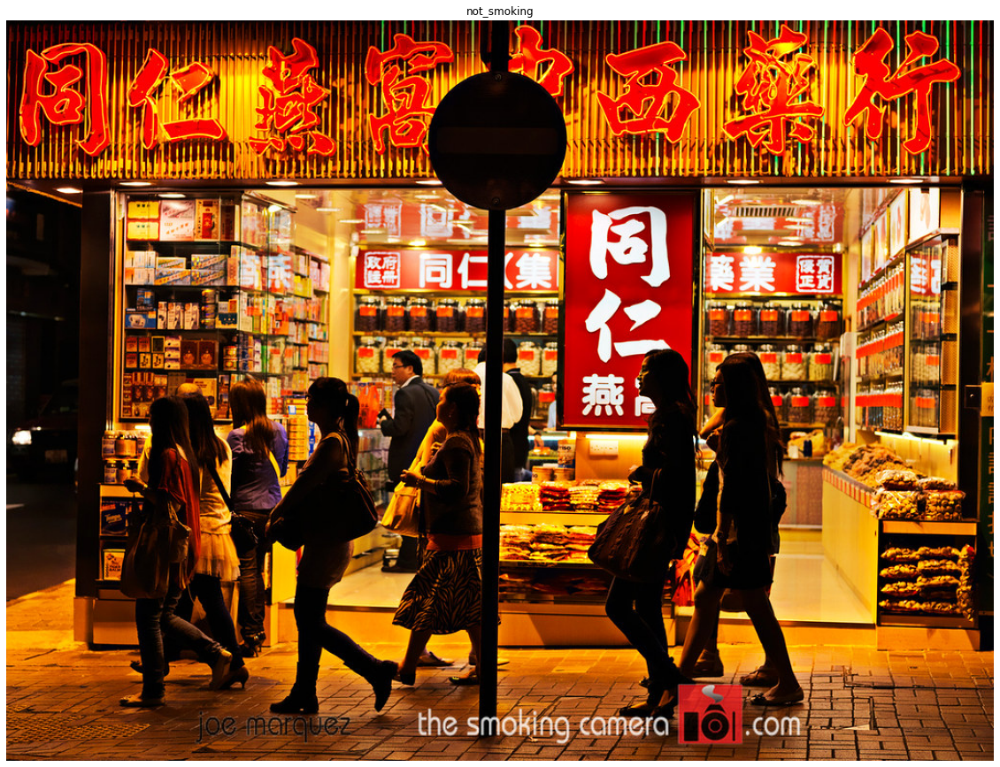

In [10]:
img, target = train_data_dataset.choose()
show(img, title=idx_to_class[int(target)])

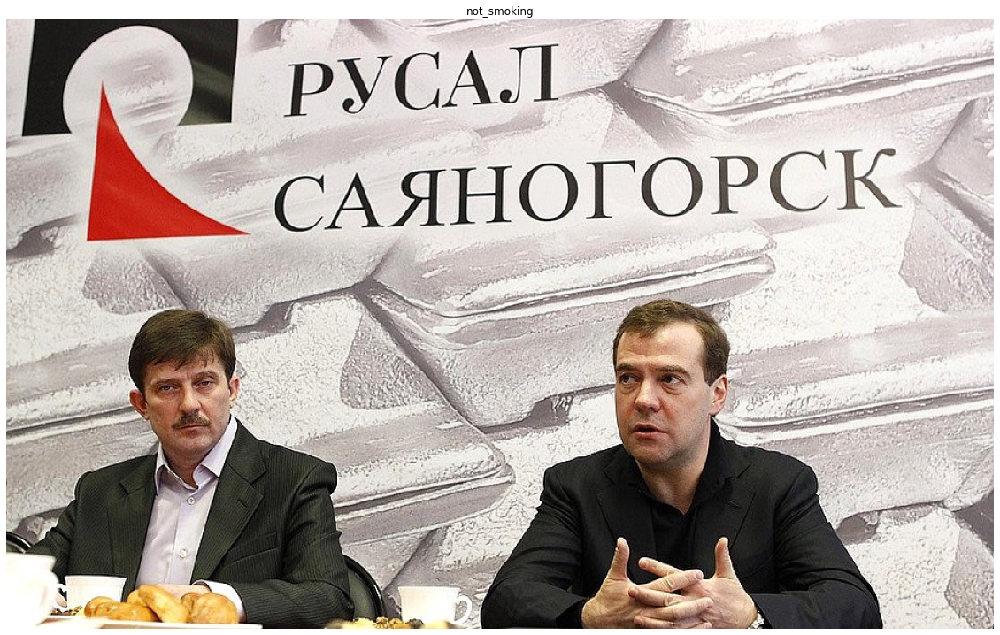

In [11]:
img, target = train_data_dataset.choose()
show(img, title=idx_to_class[int(target)])

In [12]:
inspect(*next(iter(train_dataloader)), names='image, target')

IMAGE:
Tensor	Shape: torch.Size([16, 3, 224, 224])	Min: -0.008	Max: 0.010	Mean: -0.001	dtype: torch.float32
TARGET:
Tensor	Shape: torch.Size([16])	Min: 0.000	Max: 1.000	Mean: 0.250	dtype: torch.int64


## - Classification-Based Smoking Detection 

In [13]:
class SmokingDetector(nn.Module):
    
    def __choose_backbone_model(self):

        if self.model_name == 'MobileNet_v2':
            mobile_net_v2 = models.mobilenet_v2(pretrained=True, progress=True)
            modules = list(mobile_net_v2.children())[:-1] # delete last layer
        
        elif self.model_name == 'EfficientNet_b3':
            efficient_net_b3 = models.efficientnet_b3(pretrained=True, progress=True)
            modules = list(efficient_net_b3.children())[:-1] # delete last layer            

        elif self.model_name == 'EfficientNet_b7':
            efficient_net_b7 = models.efficientnet_b7(pretrained=True, progress=True)
            modules = list(efficient_net_b7.children())[:-1] # delete last layer
       
        elif self.model_name == 'RegNet_x_32gf':    
            reg_net_x_16gf = models.regnet_x_16gf(pretrained=True, progress=True)         
            modules = list(reg_net_x_16gf.children())[:-1] # delete last layer
        
        elif self.model_name == 'RegNet_y_32gf':    
            reg_net_x_16gf = models.regnet_y_32gf(pretrained=True, progress=True)         
            modules = list(reg_net_x_16gf.children())[:-1] # delete last layer
             
        flatten_layer = nn.Flatten()
        modules += [flatten_layer]
        
        self.backbone_model = nn.Sequential(*modules)
        
        # Freeze backbone
        if self.freeze:
            for param in self.backbone_model.parameters():
                param.requires_grad = False            
                
    def __init__(self, device, model_name, class_num, sample_img_size, freeze=False):
        super().__init__()
 
        self.device = device
        self.model_name = model_name
        self.freeze = freeze

        self.__choose_backbone_model()
        x = torch.zeros(1, sample_img_size[0], sample_img_size[1], sample_img_size[2])
        output = self.backbone_model(x)
        print('Output of backbone\'s flattened layer:', output.shape)
        
        self.fc = nn.Sequential(
            nn.BatchNorm1d(output.shape[-1]),
            nn.Dropout(0.2),
            nn.Linear(output.shape[-1], 512),
            nn.ReLU(),
            nn.BatchNorm1d(512),
            nn.Dropout(0.2),
            nn.Linear(512, 128),
            nn.ReLU(),
            nn.BatchNorm1d(128),
            nn.Dropout(0.2),
            nn.Linear(128, class_num)
        )
    
    def forward(self, x):
        x = self.backbone_model(x)
        x = self.fc(x)
        return x

In [14]:
smoking_detector_model_list = []

for backbone_model in backbone_model_list:
    
    print('-' * 50)
    print('Backbone model:', backbone_model)
    print('-' * 50)
    
    sample_img_size = (3, img_size, img_size)
    
    model = SmokingDetector(device, backbone_model, class_num, sample_img_size).to(device)
    smoking_detector_model_list.append([backbone_model, model])
    
    summary(model, sample_img_size)

--------------------------------------------------
Backbone model: MobileNet_v2
--------------------------------------------------
Output of backbone's flattened layer: torch.Size([1, 62720])
Layer (type:depth-idx)                        Output Shape              Param #
├─Sequential: 1-1                             [-1, 62720]               --
|    └─Sequential: 2-1                        [-1, 1280, 7, 7]          --
|    |    └─Conv2dNormActivation: 3-1         [-1, 32, 112, 112]        928
|    |    └─InvertedResidual: 3-2             [-1, 16, 112, 112]        896
|    |    └─InvertedResidual: 3-3             [-1, 24, 56, 56]          5,136
|    |    └─InvertedResidual: 3-4             [-1, 24, 56, 56]          8,832
|    |    └─InvertedResidual: 3-5             [-1, 32, 28, 28]          10,000
|    |    └─InvertedResidual: 3-6             [-1, 32, 28, 28]          14,848
|    |    └─InvertedResidual: 3-7             [-1, 32, 28, 28]          14,848
|    |    └─InvertedResidual: 3-8

Output of backbone's flattened layer: torch.Size([1, 2048])
Layer (type:depth-idx)                        Output Shape              Param #
├─Sequential: 1-1                             [-1, 2048]                --
|    └─SimpleStemIN: 2-1                      [-1, 32, 112, 112]        --
|    |    └─Conv2d: 3-1                       [-1, 32, 112, 112]        864
|    |    └─BatchNorm2d: 3-2                  [-1, 32, 112, 112]        64
|    |    └─ReLU: 3-3                         [-1, 32, 112, 112]        --
|    └─Sequential: 2-2                        [-1, 2048, 7, 7]          --
|    |    └─AnyStage: 3-4                     [-1, 256, 56, 56]         806,400
|    |    └─AnyStage: 3-5                     [-1, 512, 28, 28]         6,704,128
|    |    └─AnyStage: 3-6                     [-1, 896, 14, 14]         34,478,080
|    |    └─AnyStage: 3-7                     [-1, 2048, 7, 7]          10,240,000
|    └─AdaptiveAvgPool2d: 2-3                 [-1, 2048, 1, 1]          --
|    └

## - Train & valid Model

In [15]:
def train(data, model, optimizer, loss_fn):
    
    # Set train
    model.train()
    
    # Get batch data
    imgs, targets = data
    
    # Inference
    outputs = model(imgs)
    
    # Get loss
    loss = loss_fn(outputs, targets)
    
    # Get class
    preds = outputs.argmax(-1)
    
    acc = (sum(preds==targets) / len(targets))
    
    # Init gradient
    model.zero_grad()
    
    # Backword propagation
    loss.backward()
    
    # Optimization 
    optimizer.step()
    
    return loss, acc

In [16]:
@torch.no_grad()
def validate(data, model, loss_fn):
    
    # Set valid
    model.eval()
    
    # Get batch data
    imgs, targets = data
    
    # Inference
    outputs = model(imgs)
    
    # Get loss
    loss = loss_fn(outputs, targets)
    
    # Get class
    preds = outputs.argmax(-1)
    
    val_acc = (sum(preds==targets) / len(targets))
    
    return loss, val_acc

--------------------------------------------------
Backbone model: MobileNet_v2
--------------------------------------------------
EPOCH: 1.000	train_loss: 0.464	train_acc: 0.799	val_loss: 0.388	val_acc: 0.842	(110.55s - 2100.36s remaining)
EPOCH: 2.000	train_loss: 0.229	train_acc: 0.919	val_loss: 0.405	val_acc: 0.851	(223.62s - 2012.57s remaining)
EPOCH: 3.000	train_loss: 0.145	train_acc: 0.949	val_loss: 0.381	val_acc: 0.837	(330.61s - 1873.46s remaining)
EPOCH: 4.000	train_loss: 0.102	train_acc: 0.968	val_loss: 0.382	val_acc: 0.863	(434.37s - 1737.47s remaining)
EPOCH: 5.000	train_loss: 0.095	train_acc: 0.967	val_loss: 0.446	val_acc: 0.863	(539.43s - 1618.28s remaining)
EPOCH: 6.000	train_loss: 0.137	train_acc: 0.955	val_loss: 0.401	val_acc: 0.858	(632.23s - 1475.21s remaining)
EPOCH: 7.000	train_loss: 0.099	train_acc: 0.961	val_loss: 0.386	val_acc: 0.870	(722.71s - 1342.17s remaining)
EPOCH: 8.000	train_loss: 0.090	train_acc: 0.967	val_loss: 0.390	val_acc: 0.864	(813.51s - 1220.26s 

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 121/121 [00:00<00:00, 1073.79it/s]


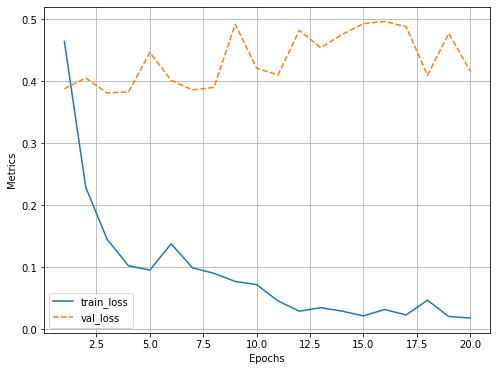

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 121/121 [00:00<00:00, 1513.71it/s]


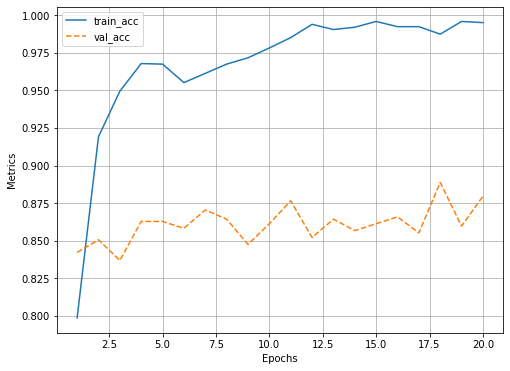

--------------------------------------------------
Backbone model: EfficientNet_b3
--------------------------------------------------
EPOCH: 1.000	train_loss: 0.539	train_acc: 0.738	val_loss: 0.460	val_acc: 0.786	(97.02s - 1843.29s remaining)
EPOCH: 2.000	train_loss: 0.355	train_acc: 0.848	val_loss: 0.414	val_acc: 0.811	(191.98s - 1727.85s remaining)
EPOCH: 3.000	train_loss: 0.278	train_acc: 0.889	val_loss: 0.394	val_acc: 0.832	(286.73s - 1624.81s remaining)
EPOCH: 4.000	train_loss: 0.205	train_acc: 0.922	val_loss: 0.374	val_acc: 0.832	(379.54s - 1518.15s remaining)
EPOCH: 5.000	train_loss: 0.140	train_acc: 0.952	val_loss: 0.396	val_acc: 0.832	(469.31s - 1407.93s remaining)
EPOCH: 6.000	train_loss: 0.115	train_acc: 0.958	val_loss: 0.369	val_acc: 0.851	(571.25s - 1332.93s remaining)
EPOCH: 7.000	train_loss: 0.093	train_acc: 0.967	val_loss: 0.378	val_acc: 0.837	(677.88s - 1258.92s remaining)
EPOCH: 8.000	train_loss: 0.103	train_acc: 0.966	val_loss: 0.387	val_acc: 0.866	(788.99s - 1183.49

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 121/121 [00:00<00:00, 1543.65it/s]


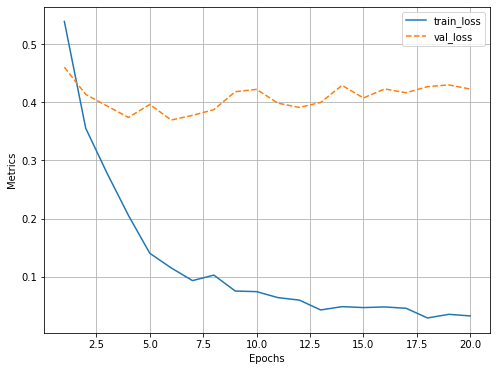

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 121/121 [00:00<00:00, 1548.83it/s]


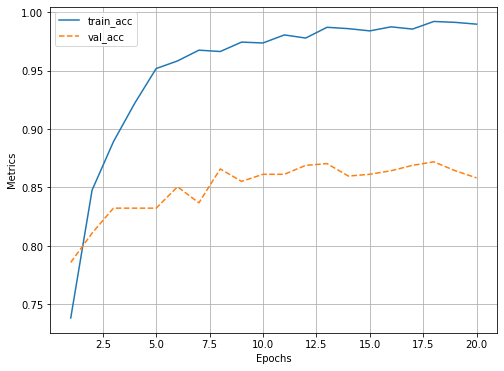

--------------------------------------------------
Backbone model: EfficientNet_b7
--------------------------------------------------
EPOCH: 1.000	train_loss: 0.523	train_acc: 0.756	val_loss: 1.277	val_acc: 0.389	(108.43s - 2060.16s remaining)
EPOCH: 2.000	train_loss: 0.253	train_acc: 0.903	val_loss: 1.812	val_acc: 0.399	(217.27s - 1955.43s remaining)
EPOCH: 3.000	train_loss: 0.135	train_acc: 0.959	val_loss: 1.451	val_acc: 0.462	(325.32s - 1843.48s remaining)
EPOCH: 4.000	train_loss: 0.110	train_acc: 0.965	val_loss: 0.937	val_acc: 0.660	(433.09s - 1732.34s remaining)
EPOCH: 5.000	train_loss: 0.083	train_acc: 0.972	val_loss: 0.392	val_acc: 0.840	(541.00s - 1623.01s remaining)
EPOCH: 6.000	train_loss: 0.090	train_acc: 0.969	val_loss: 0.412	val_acc: 0.851	(648.60s - 1513.39s remaining)
EPOCH: 7.000	train_loss: 0.092	train_acc: 0.966	val_loss: 0.411	val_acc: 0.858	(756.47s - 1404.88s remaining)
EPOCH: 8.000	train_loss: 0.078	train_acc: 0.974	val_loss: 0.365	val_acc: 0.869	(864.39s - 1296.5

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 121/121 [00:00<00:00, 1327.26it/s]


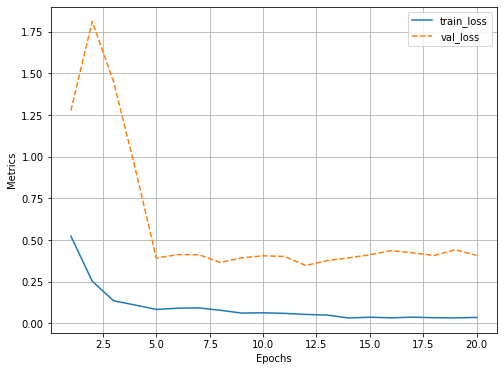

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 121/121 [00:00<00:00, 1543.24it/s]


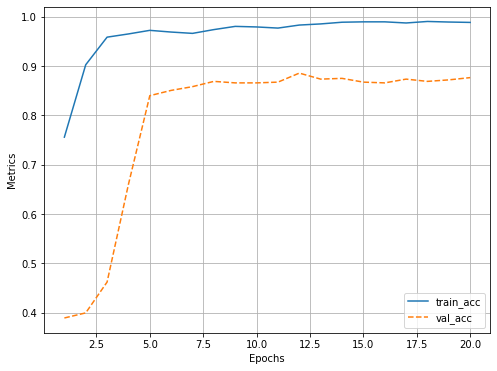

--------------------------------------------------
Backbone model: RegNet_x_32gf
--------------------------------------------------
EPOCH: 1.000	train_loss: 0.445	train_acc: 0.800	val_loss: 0.309	val_acc: 0.875	(111.53s - 2118.98s remaining)
EPOCH: 2.000	train_loss: 0.188	train_acc: 0.933	val_loss: 0.282	val_acc: 0.875	(222.72s - 2004.52s remaining)
EPOCH: 3.000	train_loss: 0.103	train_acc: 0.965	val_loss: 0.335	val_acc: 0.867	(333.50s - 1889.85s remaining)
EPOCH: 4.000	train_loss: 0.087	train_acc: 0.970	val_loss: 0.315	val_acc: 0.887	(445.12s - 1780.47s remaining)
EPOCH: 5.000	train_loss: 0.113	train_acc: 0.960	val_loss: 0.334	val_acc: 0.884	(557.15s - 1671.46s remaining)
EPOCH: 6.000	train_loss: 0.106	train_acc: 0.963	val_loss: 0.348	val_acc: 0.887	(668.94s - 1560.86s remaining)
EPOCH: 7.000	train_loss: 0.104	train_acc: 0.961	val_loss: 0.302	val_acc: 0.895	(780.20s - 1448.94s remaining)
EPOCH: 8.000	train_loss: 0.106	train_acc: 0.963	val_loss: 0.338	val_acc: 0.883	(890.84s - 1336.26s

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 121/121 [00:00<00:00, 1174.54it/s]


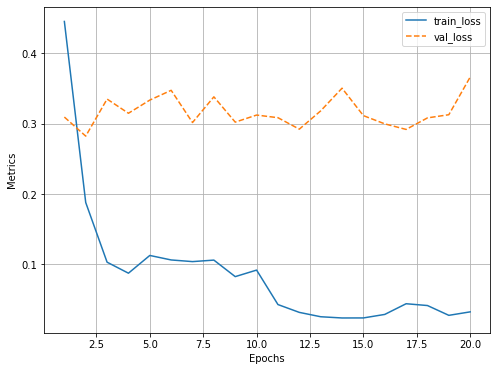

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 121/121 [00:00<00:00, 1560.88it/s]


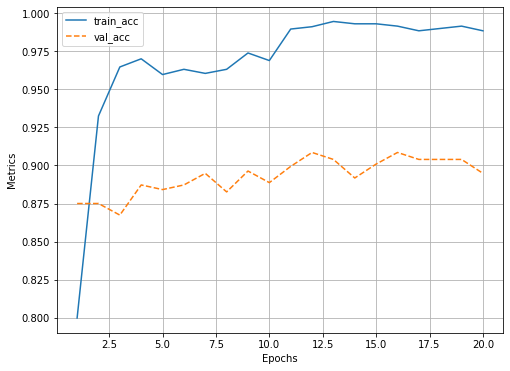

--------------------------------------------------
Backbone model: RegNet_y_32gf
--------------------------------------------------
EPOCH: 1.000	train_loss: 0.446	train_acc: 0.797	val_loss: 0.315	val_acc: 0.886	(114.43s - 2174.25s remaining)
EPOCH: 2.000	train_loss: 0.221	train_acc: 0.916	val_loss: 0.308	val_acc: 0.873	(228.55s - 2056.92s remaining)
EPOCH: 3.000	train_loss: 0.181	train_acc: 0.938	val_loss: 0.363	val_acc: 0.867	(343.12s - 1944.35s remaining)
EPOCH: 4.000	train_loss: 0.140	train_acc: 0.952	val_loss: 0.319	val_acc: 0.880	(459.07s - 1836.29s remaining)
EPOCH: 5.000	train_loss: 0.109	train_acc: 0.965	val_loss: 0.274	val_acc: 0.905	(572.74s - 1718.21s remaining)
EPOCH: 6.000	train_loss: 0.102	train_acc: 0.966	val_loss: 0.302	val_acc: 0.890	(686.08s - 1600.86s remaining)
EPOCH: 7.000	train_loss: 0.070	train_acc: 0.979	val_loss: 0.313	val_acc: 0.878	(802.02s - 1489.46s remaining)
EPOCH: 8.000	train_loss: 0.120	train_acc: 0.960	val_loss: 0.400	val_acc: 0.855	(917.80s - 1376.69s

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 121/121 [00:00<00:00, 1428.96it/s]


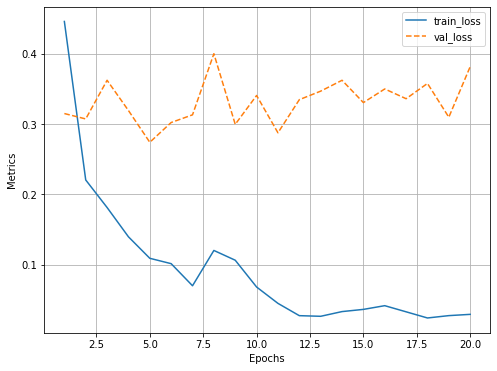

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 121/121 [00:00<00:00, 1507.25it/s]


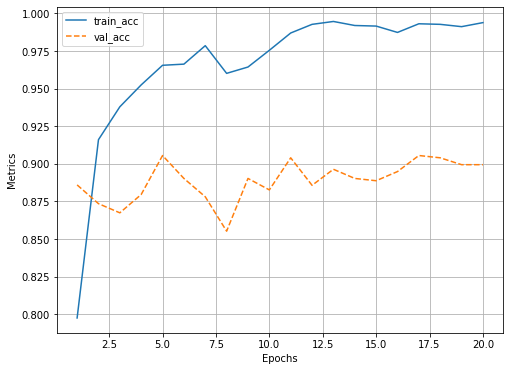

In [17]:
best_best_acc = -1
best_model_idx = 0

for model_id, (name, smoking_detector) in enumerate(smoking_detector_model_list):

    print('-' * 50)
    print('Backbone model:', name)
    print('-' * 50)   
    
    log = Report(epochs)
    
    # Loss function
    loss_fn = nn.CrossEntropyLoss()
    
    # Convert to cuda
    model = smoking_detector.to(device)

    # Optimizer
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    # Gradient sceduler
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10,
                                         gamma=0.5)
    best_acc = -1
    
    for epoch in range(epochs):
                
        n_batch = len(train_dataloader)
        for i, data in enumerate(train_dataloader):
            train_loss, train_acc = train(data, model, optimizer, loss_fn)
        
            pos = epoch + ((i+1)/n_batch)
            log.record(pos=pos, train_loss=train_loss, train_acc=train_acc, end='\r')
        
        n_batch = len(val_dataloader)
        for i, data in enumerate(val_dataloader):
            val_loss, val_acc = validate(data, model, loss_fn)
            
            pos = epoch + ((i+1)/n_batch)
            log.record(pos=pos, val_loss=val_loss, val_acc=val_acc, end='\r')
        
        scheduler.step()
        
        avg_val_acc = log.report_avgs(epoch+1, return_avgs=True)['val_acc']
        avg_val_acc = round(float(avg_val_acc), 3)
        if best_acc < avg_val_acc: best_acc = avg_val_acc

    print()
    print('Best accuracy:', best_acc)
    print()       
        
    if best_acc > best_best_acc:
        best_best_acc = best_acc
        best_model_idx = model_id
    
    # Show plot
    log.plot_epochs(['train_loss', 'val_loss'])
    log.plot_epochs(['train_acc', 'val_acc'])

In [18]:
print('Best model:', backbone_model_list[best_model_idx])
print('Total best accuracy:', best_best_acc)

Best model: RegNet_x_32gf
Total best accuracy: 0.909


## - Test

In [19]:
smo_test_file_path1 = os.path.join(data_path, 'smoking', os.listdir(os.path.join(data_path, 'smoking'))[1])
smo_test_file_path2 = os.path.join(data_path, 'smoking', os.listdir(os.path.join(data_path, 'smoking'))[10])
smo_test_file_path3 = os.path.join(data_path, 'smoking', os.listdir(os.path.join(data_path, 'smoking'))[100])
print('test_file_path1:', smo_test_file_path1)
print('test_file_path2:', smo_test_file_path2)
print('test_file_path3:', smo_test_file_path3)

test_file_path1: ./data/cigarette-smoker-detection/smoking/bb0145.jpg
test_file_path2: ./data/cigarette-smoker-detection/smoking/c00109.jpg
test_file_path3: ./data/cigarette-smoker-detection/smoking/bb0509.jpg


In [20]:
non_test_file_path1 = os.path.join(data_path, 'not_smoking', os.listdir(os.path.join(data_path, 'not_smoking'))[1])
non_test_file_path2 = os.path.join(data_path, 'not_smoking', os.listdir(os.path.join(data_path, 'not_smoking'))[10])
non_test_file_path3 = os.path.join(data_path, 'not_smoking', os.listdir(os.path.join(data_path, 'not_smoking'))[100])
print('test_file_path4:', non_test_file_path1)
print('test_file_path5:', non_test_file_path2)
print('test_file_path6:', non_test_file_path3)

test_file_path4: ./data/cigarette-smoker-detection/not_smoking/ggg411.jpg
test_file_path5: ./data/cigarette-smoker-detection/not_smoking/ggg691.jpg
test_file_path6: ./data/cigarette-smoker-detection/not_smoking/ggg317.jpeg


In [21]:
transform = transforms.Compose([ 
    transforms.Resize([img_size, img_size]), 
    transforms.ToTensor(),
    # std multiply by 255 to convert img of [0, 255]
    # to img of [0, 1]
    transforms.Normalize((0.485, 0.456, 0.406), 
                         (0.229*255, 0.224*255, 0.225*255))]
)

In [22]:
model = smoking_detector_model_list[best_model_idx][1]
model.eval()

SmokingDetector(
  (backbone_model): Sequential(
    (0): SimpleStemIN(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (block1): AnyStage(
        (block1-0): ResBottleneckBlock(
          (proj): Conv2dNormActivation(
            (0): Conv2d(32, 256, kernel_size=(1, 1), stride=(2, 2), bias=False)
            (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          )
          (f): BottleneckTransform(
            (a): Conv2dNormActivation(
              (0): Conv2d(32, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
              (2): ReLU(inplace=True)
            )
            (b): Conv2dNormActivation(
              (0): Conv2d(256, 256, kernel_size=

In [23]:
test_file_path_list = [smo_test_file_path1, smo_test_file_path2, smo_test_file_path3, non_test_file_path1, non_test_file_path2, non_test_file_path3]
test_preds_list = []
show_img_list = []

for test_file_path in test_file_path_list:
    img = Image.open(test_file_path).convert('RGB')
    show_img = copy.deepcopy(img)
    show_img_list.append(show_img)
    
    img = transform(img)
    img = img.reshape((1,) + img.shape)
    img = torch.tensor(img).to(device)
    
    outputs = model(img)
    test_preds = outputs.argmax(-1)
    test_preds_list.append(test_preds)

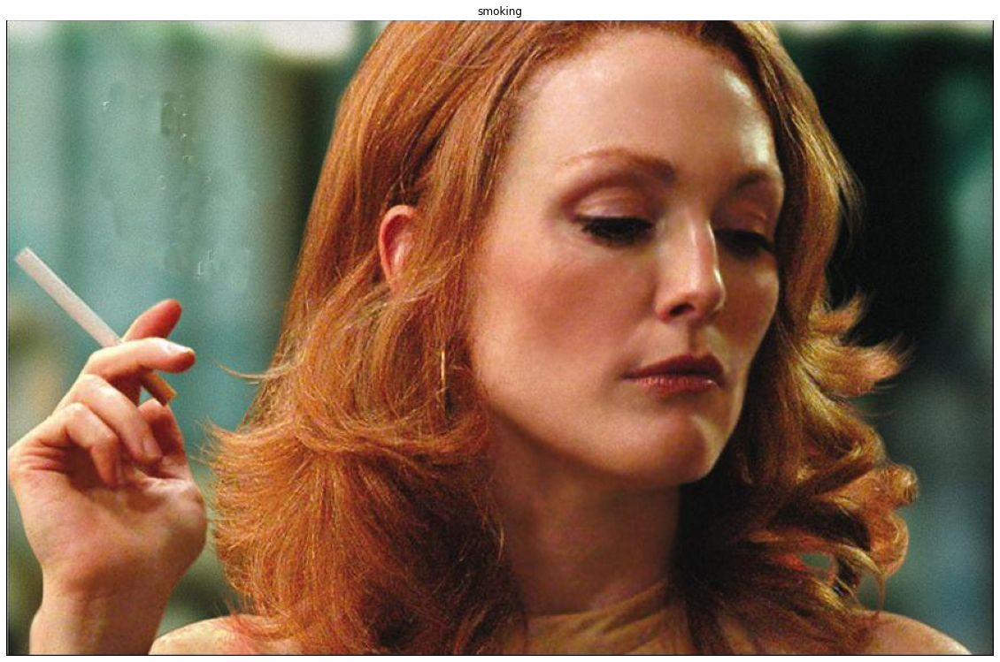

In [24]:
show(show_img_list[0], title=idx_to_class[int(test_preds_list[0])])

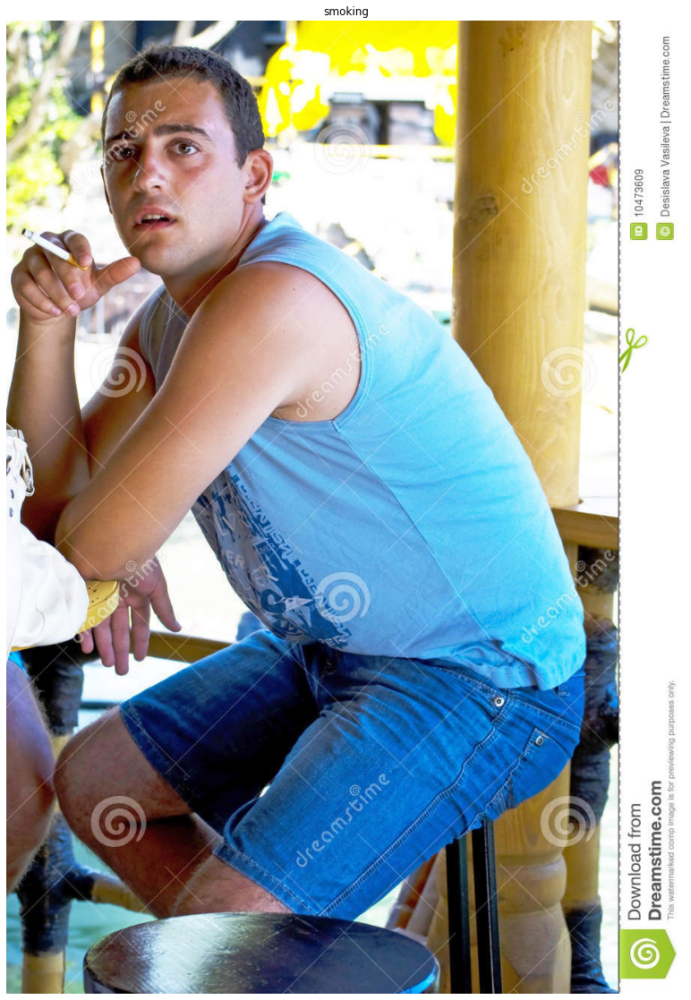

In [25]:
show(show_img_list[1], title=idx_to_class[int(test_preds_list[1])])

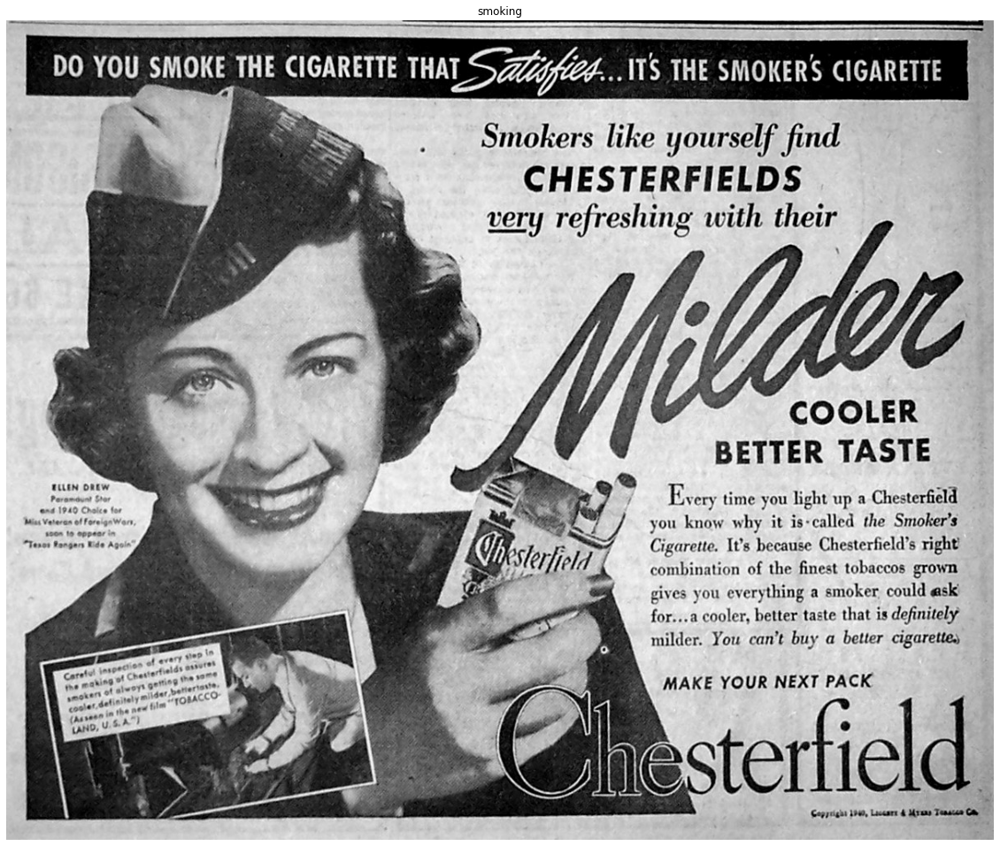

In [26]:
show(show_img_list[2], title=idx_to_class[int(test_preds_list[2])])

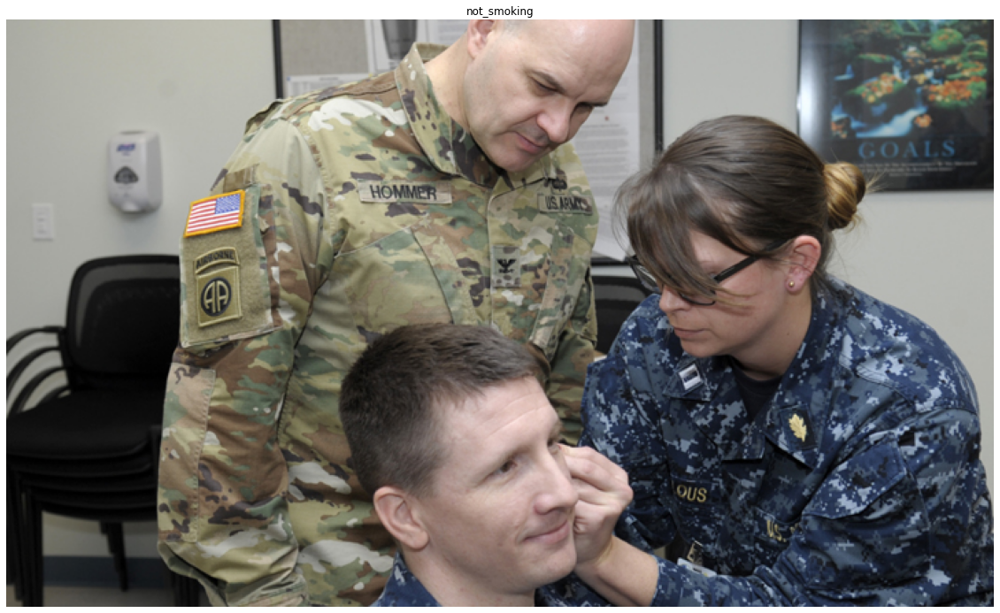

In [27]:
show(show_img_list[3], title=idx_to_class[int(test_preds_list[3])])

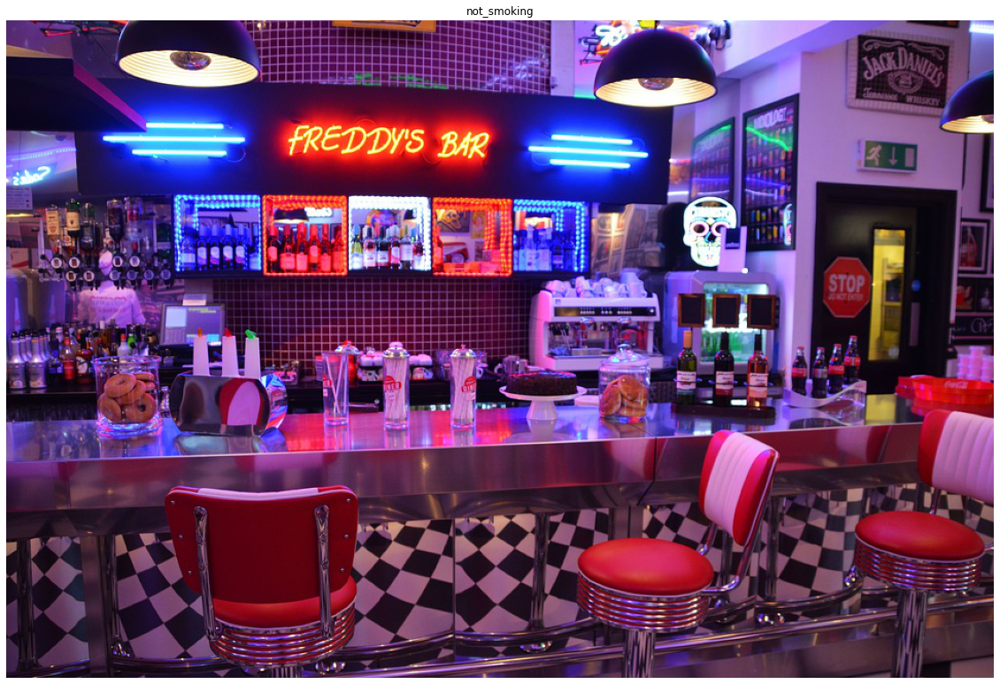

In [28]:
show(show_img_list[4], title=idx_to_class[int(test_preds_list[4])])

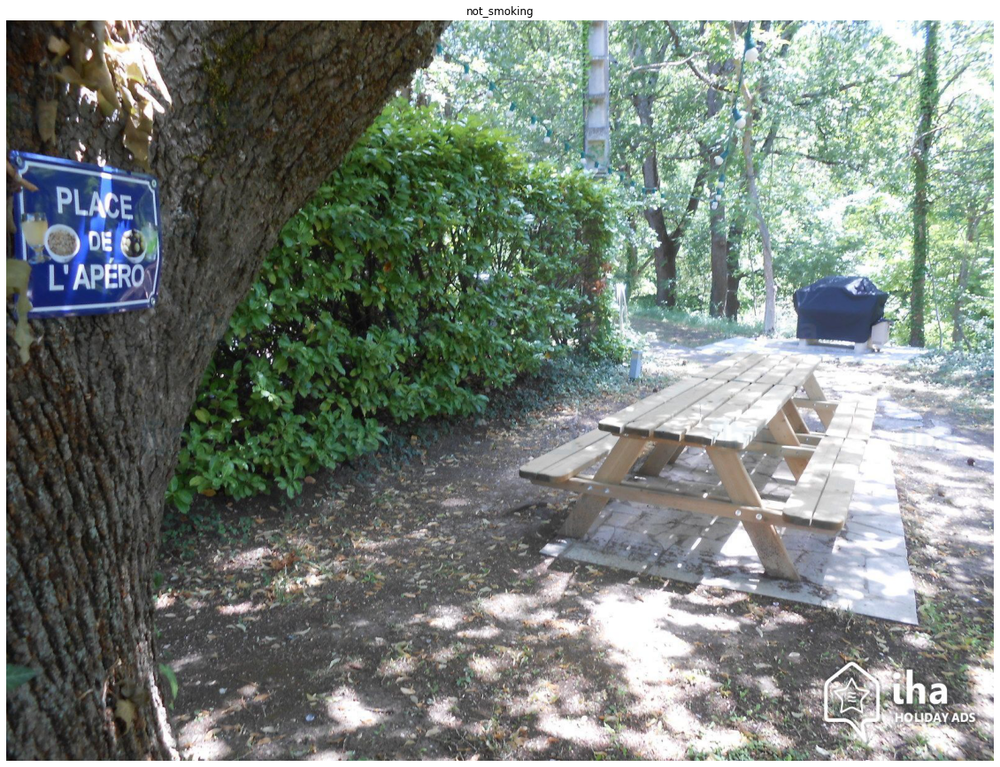

In [29]:
show(show_img_list[5], title=idx_to_class[int(test_preds_list[5])])